<a href="https://colab.research.google.com/github/ShreeVishal/Final-Year-Project/blob/main/SegNet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import numpy as np
import keras
import tensorflow as tf
import matplotlib.pyplot as plt
from keras import layers
import tensorflow_datasets as tfds
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from skimage.io import imread, imshow, imsave
from skimage.transform import resize

In [ ]:
from google.colab import drive

drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
dataset, info = tfds.load('oxford_iiit_pet:3.*.*', with_info=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Shuffling /root/tensorflow_datasets/oxford_iiit_pet/3.2.0.incompleteNOLXXK/oxford_iiit_pet-train.tfrecord*...:…

Generating test examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_iiit_pet/3.2.0.incompleteNOLXXK/oxford_iiit_pet-test.tfrecord*...: …

Dataset oxford_iiit_pet downloaded and prepared to /root/tensorflow_datasets/oxford_iiit_pet/3.2.0. Subsequent calls will reuse this data.


In [ ]:
def resize(input_image, input_mask):
   input_image = tf.image.resize(input_image, (128, 128), method="nearest")
   input_mask = tf.image.resize(input_mask, (128, 128), method="nearest")

   return input_image, input_mask

In [ ]:
def augment(input_image, input_mask):
   if tf.random.uniform(()) > 0.5:
       # Random flipping of the image and mask
       input_image = tf.image.flip_left_right(input_image)
       input_mask = tf.image.flip_left_right(input_mask)

   return input_image, input_mask

In [ ]:
class Augment(tf.keras.layers.Layer):
  def __init__(self, seed=42):
    super().__init__()
    # both use the same seed, so they'll make the same random changes.
    self.augment_inputs = tf.keras.layers.RandomFlip(mode="horizontal", seed=seed)
    self.augment_labels = tf.keras.layers.RandomFlip(mode="horizontal", seed=seed)
  
  def call(self, inputs, labels):
    inputs = self.augment_inputs(inputs)
    labels = self.augment_labels(labels)
    return inputs, labels

In [ ]:
def normalize(input_image, input_mask):
   input_image = tf.cast(input_image, tf.float32) / 255.0
   input_mask -= 1
   return input_image, input_mask

In [ ]:
def load_image_train(datapoint):
   input_image = datapoint["image"]
   input_mask = datapoint["segmentation_mask"]
   input_image, input_mask = resize(input_image, input_mask)
   input_image, input_mask = augment(input_image, input_mask)
   input_image, input_mask = normalize(input_image, input_mask)

   return input_image, input_mask

def load_image_test(datapoint):
   input_image = datapoint["image"]
   input_mask = datapoint["segmentation_mask"]
   input_image, input_mask = resize(input_image, input_mask)
   input_image, input_mask = normalize(input_image, input_mask)

   return input_image, input_mask

In [ ]:
train_dataset = dataset["train"].map(load_image_train, num_parallel_calls=tf.data.AUTOTUNE)
test_dataset = dataset["test"].map(load_image_test, num_parallel_calls=tf.data.AUTOTUNE)

In [ ]:
BATCH_SIZE = 64
BUFFER_SIZE = 1000
#train_batches = train_dataset.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_batches = (
    train_dataset
    .cache()
    .shuffle(BUFFER_SIZE)
    .batch(BATCH_SIZE)
    .repeat()
    .map(Augment())
    .prefetch(buffer_size=tf.data.AUTOTUNE))
test_batches = test_dataset.batch(BATCH_SIZE)
#train_batches = train_batches.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
#validation_batches = test_dataset.take(3000).batch(BATCH_SIZE)
#test_batches = test_dataset.skip(3000).take(669).batch(BATCH_SIZE)

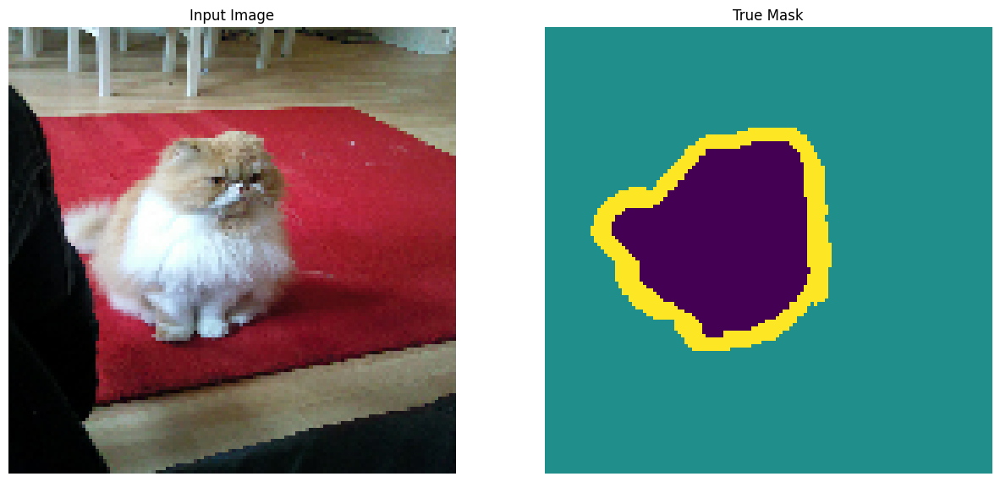

In [ ]:
def display(display_list):
 plt.figure(figsize=(15, 15))

 title = ["Input Image", "True Mask", "Predicted Mask"]

 for i in range(len(display_list)):
   plt.subplot(1, len(display_list), i+1)
   plt.title(title[i])
   plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
   plt.axis("off")
 plt.show()

sample_batch = next(iter(train_batches))
random_index = np.random.choice(sample_batch[0].shape[0])
sample_image, sample_mask = sample_batch[0][random_index], sample_batch[1][random_index]
display([sample_image, sample_mask])

In [ ]:
inputs = layers.Input(shape=(128,128,3))

# Encoder
conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
conv4 = Conv2D(512, (3, 3), activation='relu', padding='same')(pool3)

# Decoder
conv5 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv4)
up6 = UpSampling2D(size=(2, 2))(conv5)
conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(up6)
up7 = UpSampling2D(size=(2, 2))(conv6)
conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(up7)
up8 = UpSampling2D(size=(2, 2))(conv7)
conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(up8)

outputs = layers.Conv2D(3, 1, padding="same", activation='softmax')(conv8)

segnet_model = Model(inputs=inputs, outputs=outputs)
segnet_model.compile(optimizer=tf.keras.optimizers.Adam(), loss='sparse_categorical_crossentropy', metrics=['accuracy'])



In [ ]:
callbacks = [
    EarlyStopping(patience=10, verbose=1),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('/content/drive/MyDrive/FYP2/Segnet_Testing.h5', 
                    verbose=1, save_best_only=True, save_weights_only=True)
]

In [ ]:
NUM_EPOCHS = 20

TRAIN_LENGTH = info.splits["train"].num_examples
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
VAL_SUBSPLITS = 5
TEST_LENTH = info.splits["test"].num_examples
VALIDATION_STEPS = TEST_LENTH // BATCH_SIZE // VAL_SUBSPLITS

model_history = segnet_model.fit(train_batches,
                              epochs=NUM_EPOCHS,
                              callbacks = callbacks,
                              steps_per_epoch=STEPS_PER_EPOCH,
                              validation_steps=VALIDATION_STEPS,
                              validation_data=test_batches)

Epoch 1/20
57/57 [==============================] - ETA: 0s - loss: 0.9251 - accuracy: 0.6103
Epoch 1: val_loss improved from inf to 0.83042, saving model to /content/drive/MyDrive/FYP2/Segnet_Testing.h5
57/57 [==============================] - 53s 403ms/step - loss: 0.9251 - accuracy: 0.6103 - val_loss: 0.8304 - val_accuracy: 0.6688 - lr: 0.0010
Epoch 2/20
57/57 [==============================] - ETA: 0s - loss: 0.7445 - accuracy: 0.7004
Epoch 2: val_loss improved from 0.83042 to 0.70699, saving model to /content/drive/MyDrive/FYP2/Segnet_Testing.h5
57/57 [==============================] - 27s 356ms/step - loss: 0.7445 - accuracy: 0.7004 - val_loss: 0.7070 - val_accuracy: 0.7088 - lr: 0.0010
Epoch 3/20
57/57 [==============================] - ETA: 0s - loss: 0.6309 - accuracy: 0.7443
Epoch 3: val_loss improved from 0.70699 to 0.62104, saving model to /content/drive/MyDrive/FYP2/Segnet_Testing.h5
57/57 [==============================] - 20s 351ms/step - loss: 0.6309 - accuracy: 0.7443 

number of batches: 58
2/2 [==============================] - 1s 74ms/step


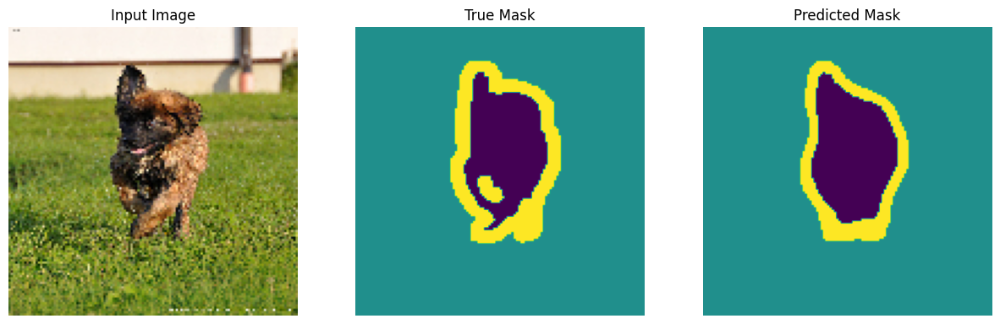

2/2 [==============================] - 0s 87ms/step


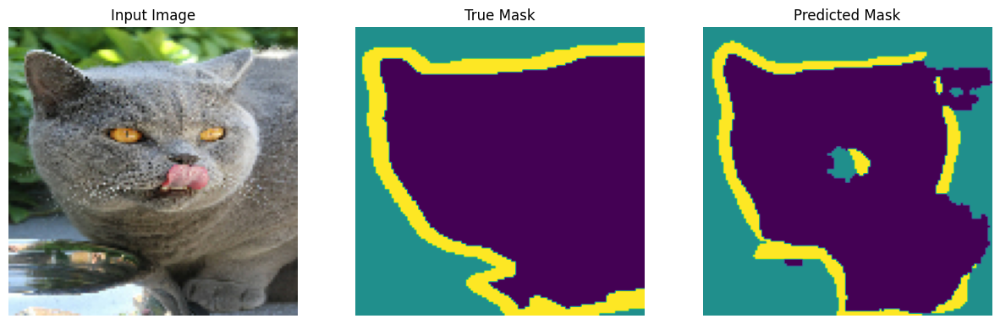

2/2 [==============================] - 0s 81ms/step


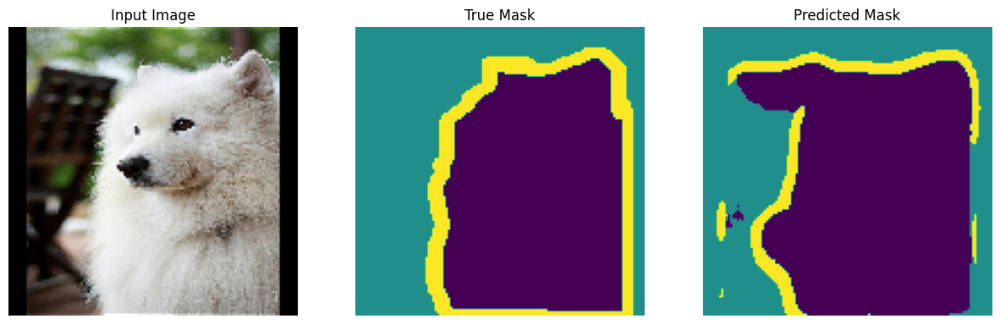

2/2 [==============================] - 0s 75ms/step


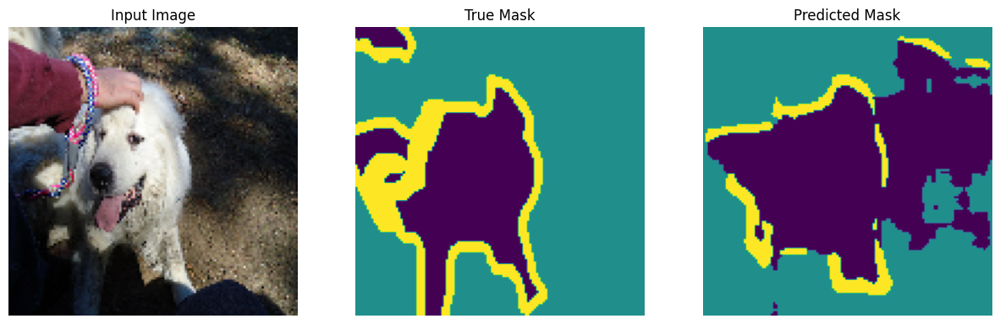

2/2 [==============================] - 0s 66ms/step


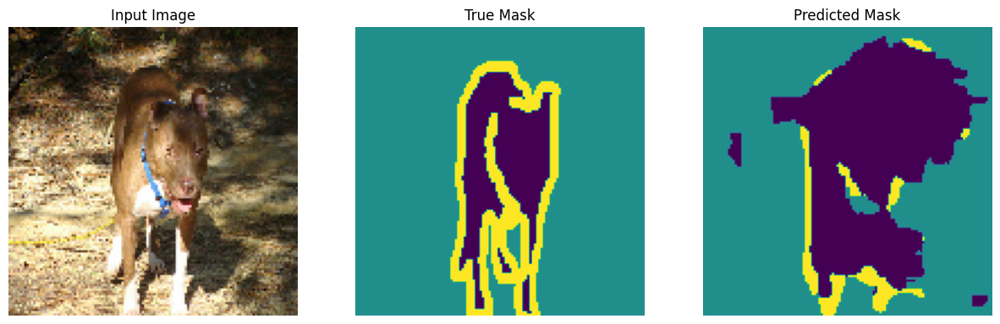

2/2 [==============================] - 0s 103ms/step


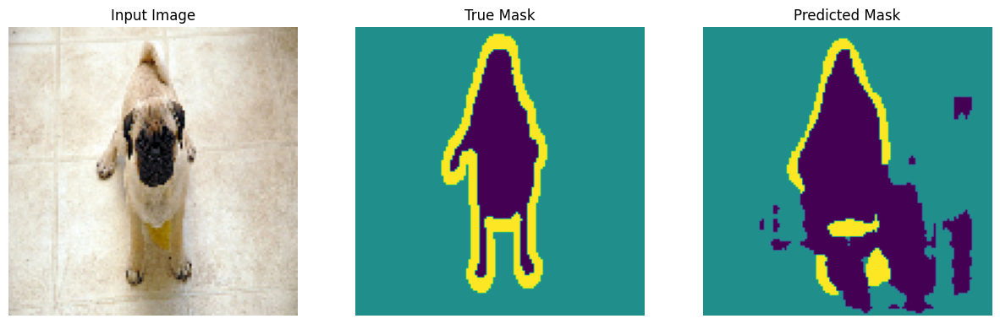

2/2 [==============================] - 0s 83ms/step


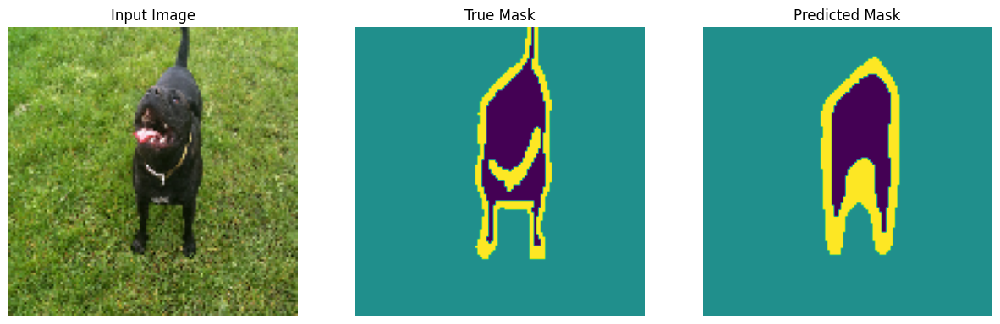

2/2 [==============================] - 0s 79ms/step


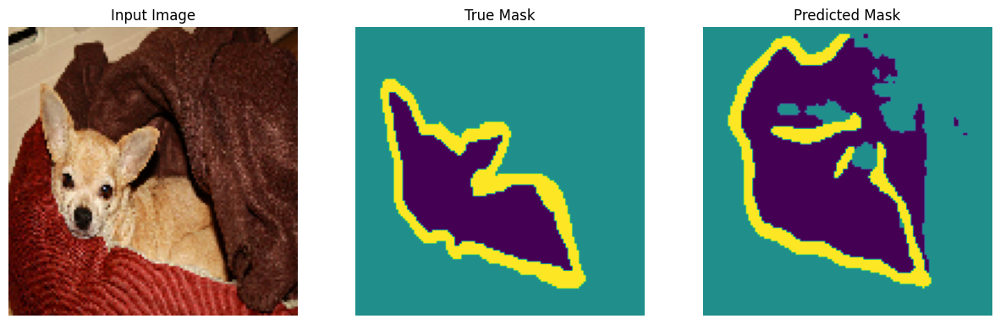

2/2 [==============================] - 0s 75ms/step


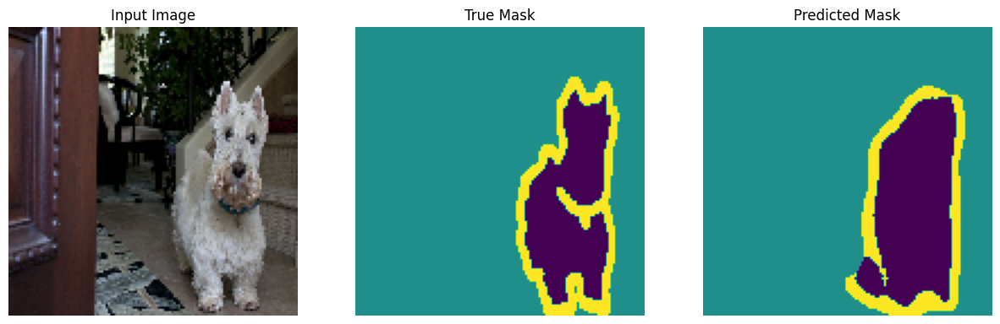

2/2 [==============================] - 0s 50ms/step


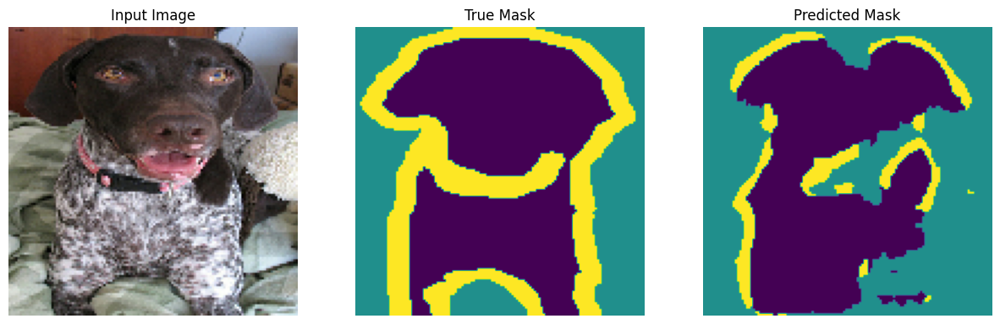

2/2 [==============================] - 0s 54ms/step


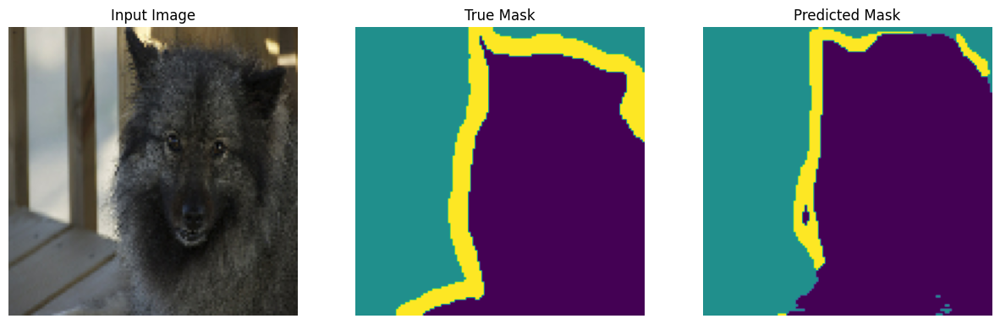

2/2 [==============================] - 0s 58ms/step


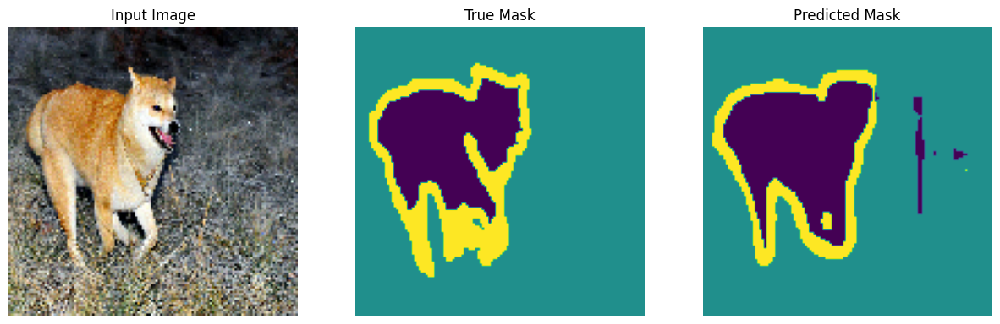

2/2 [==============================] - 0s 73ms/step


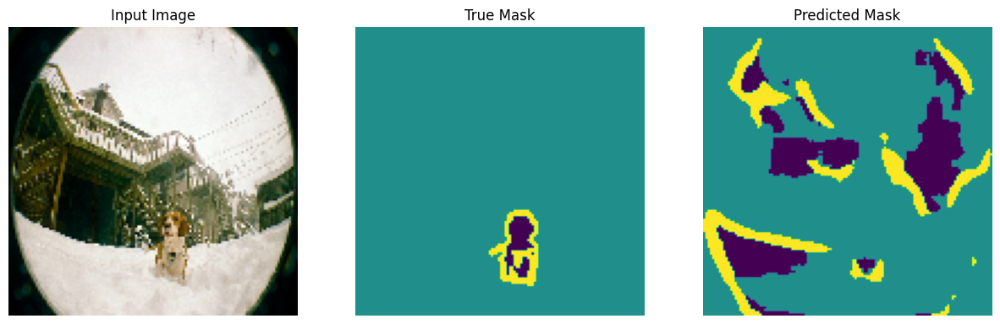

2/2 [==============================] - 0s 56ms/step


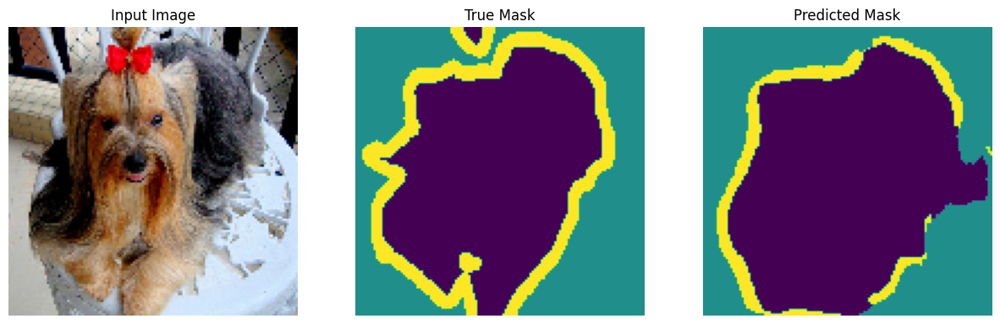

2/2 [==============================] - 0s 56ms/step


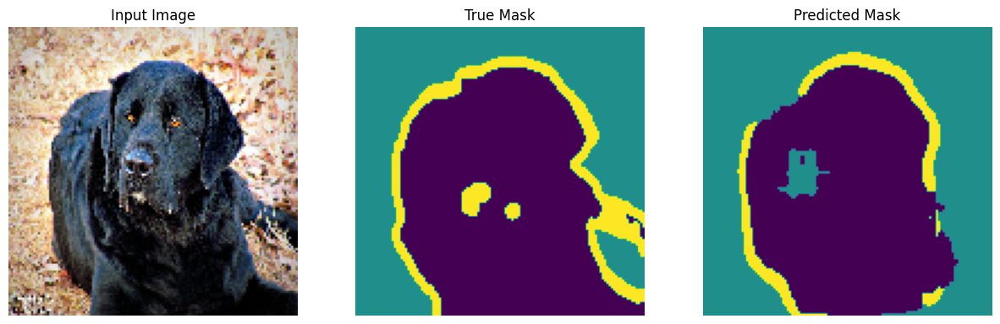

2/2 [==============================] - 0s 56ms/step


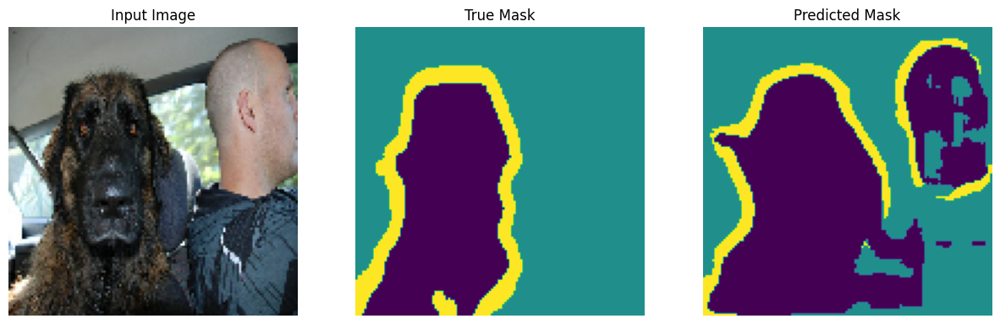

2/2 [==============================] - 0s 61ms/step


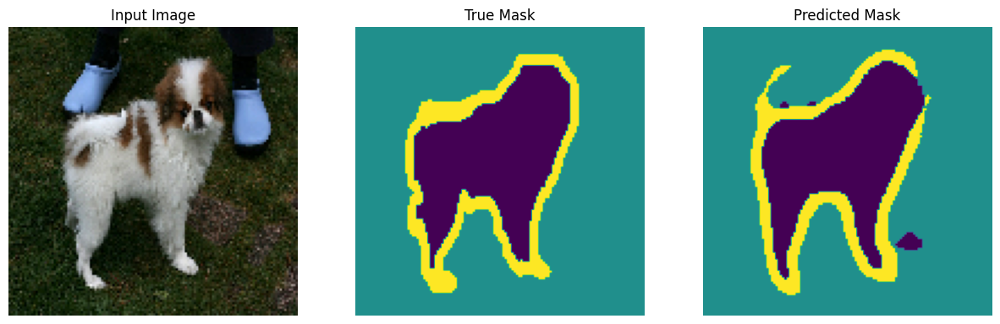

2/2 [==============================] - 0s 58ms/step


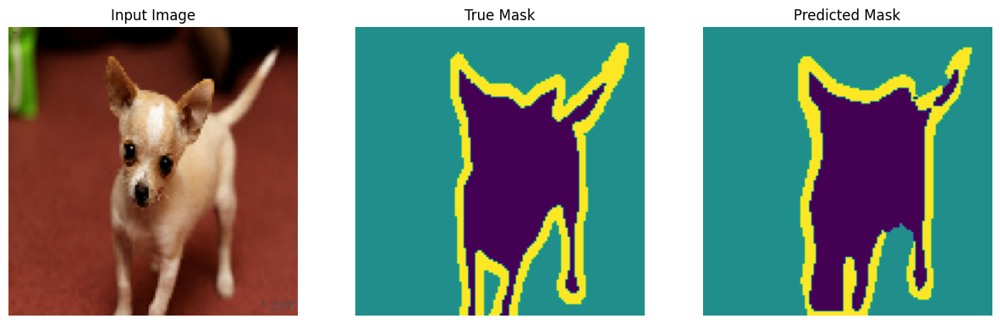

2/2 [==============================] - 0s 39ms/step


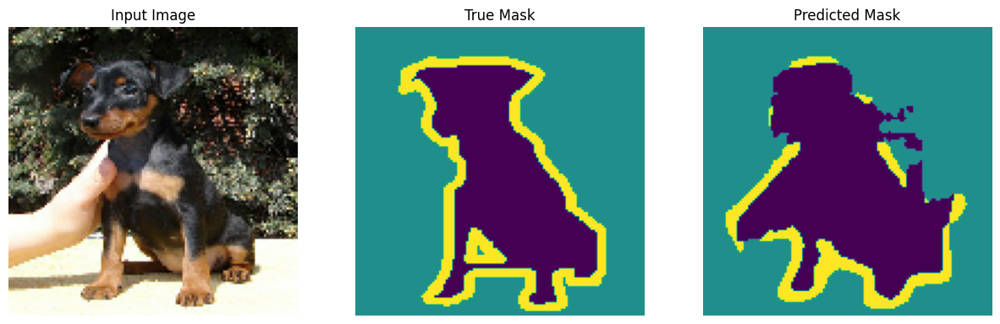

2/2 [==============================] - 0s 55ms/step


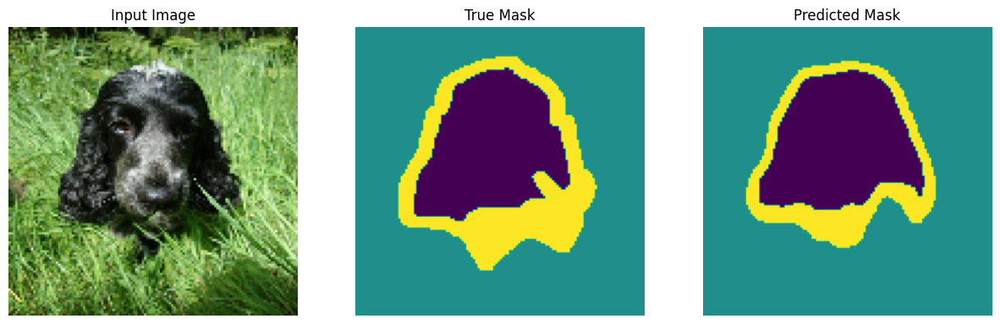

2/2 [==============================] - 0s 45ms/step


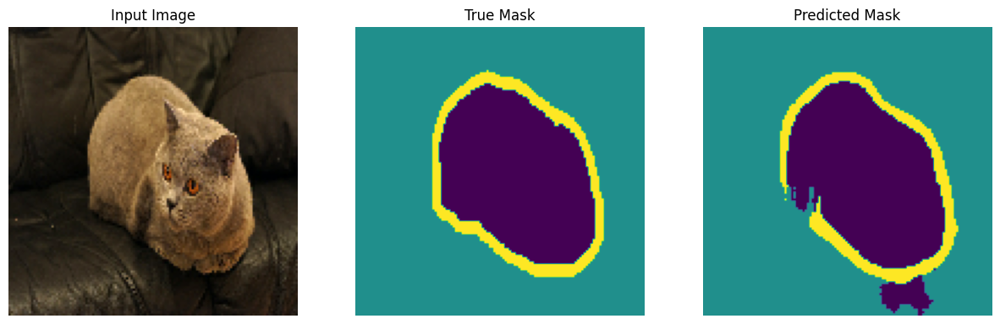

2/2 [==============================] - 0s 52ms/step


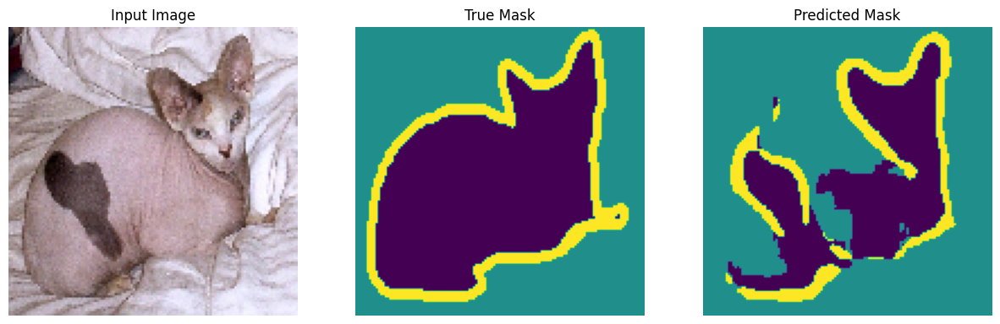

2/2 [==============================] - 0s 43ms/step


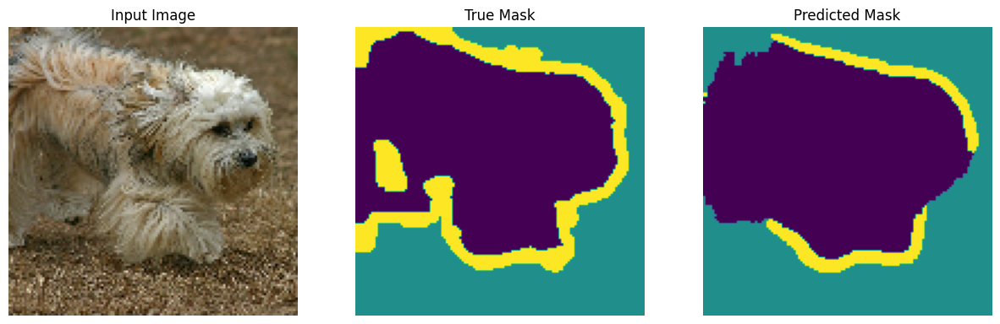

2/2 [==============================] - 0s 80ms/step


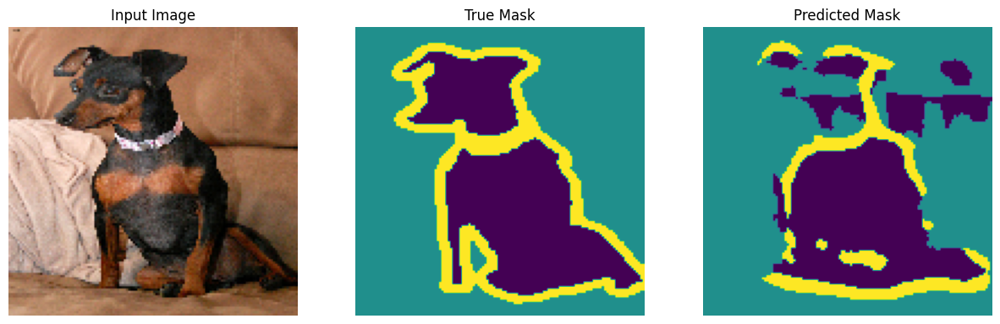

2/2 [==============================] - 0s 63ms/step


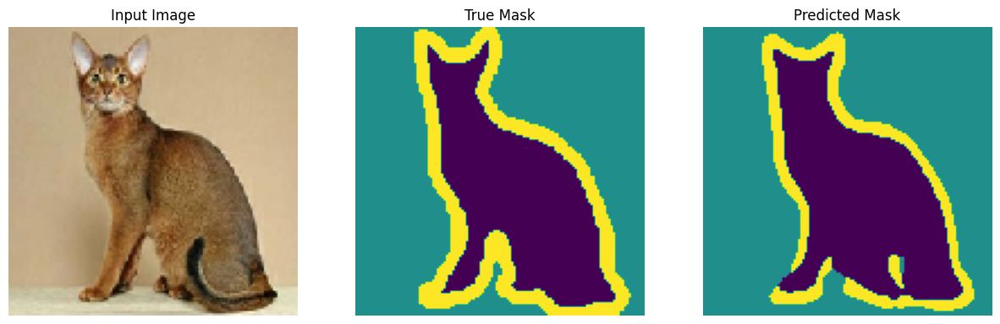

2/2 [==============================] - 0s 83ms/step


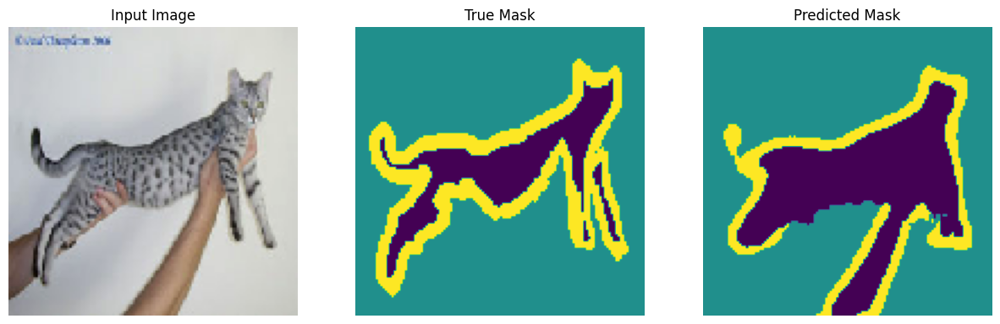

2/2 [==============================] - 0s 78ms/step


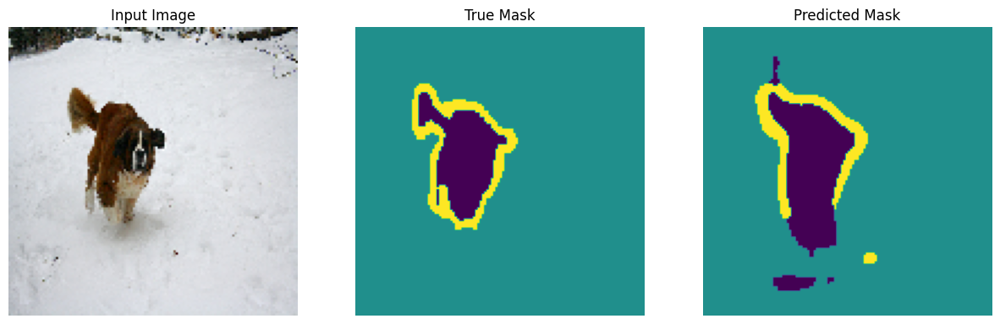

2/2 [==============================] - 0s 70ms/step


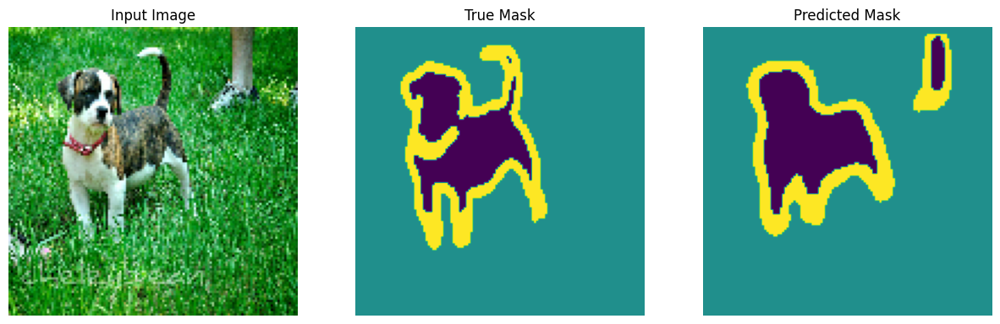

2/2 [==============================] - 0s 64ms/step


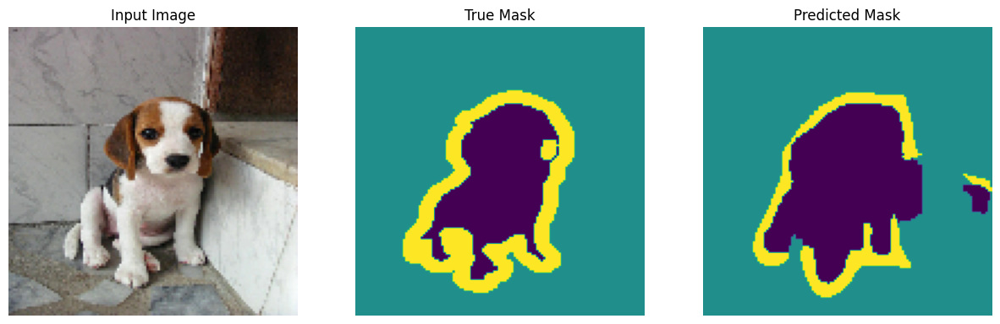

2/2 [==============================] - 0s 59ms/step


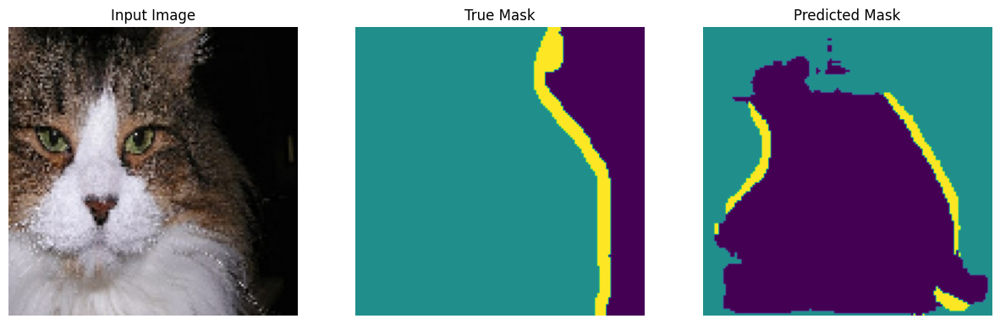

2/2 [==============================] - 0s 49ms/step


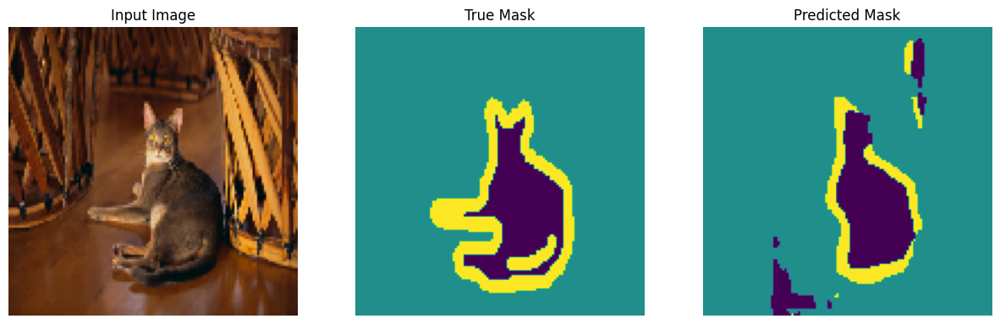

2/2 [==============================] - 0s 59ms/step


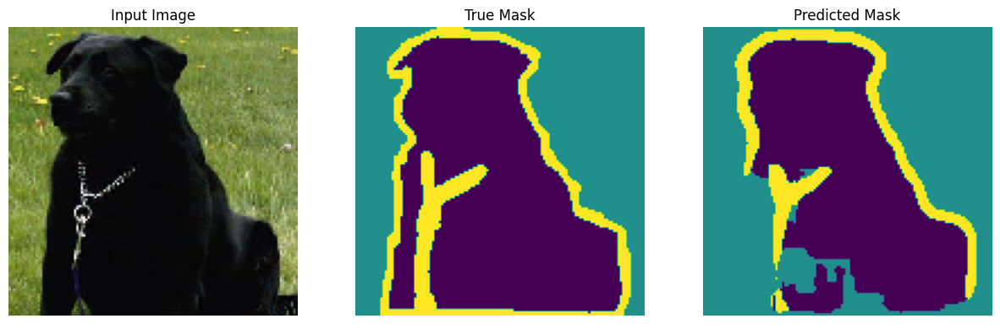

2/2 [==============================] - 0s 63ms/step


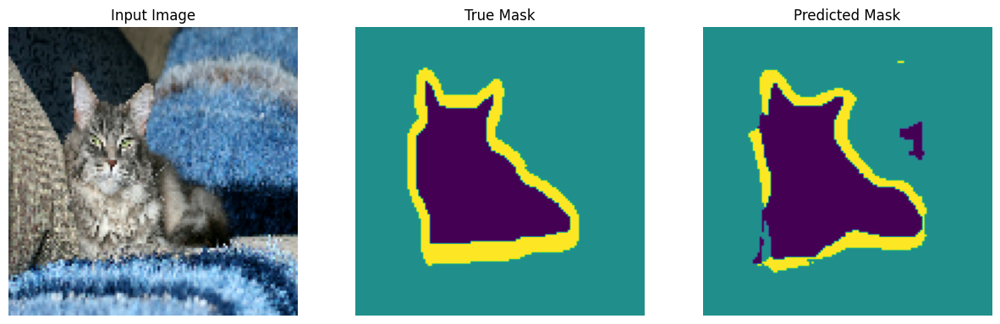

2/2 [==============================] - 0s 68ms/step


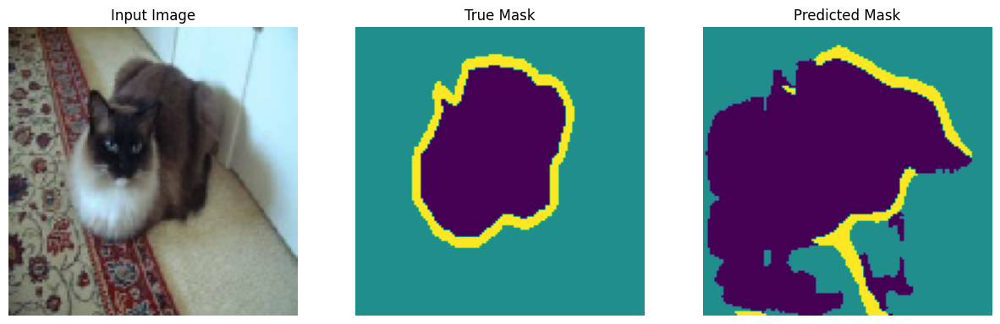

2/2 [==============================] - 0s 59ms/step


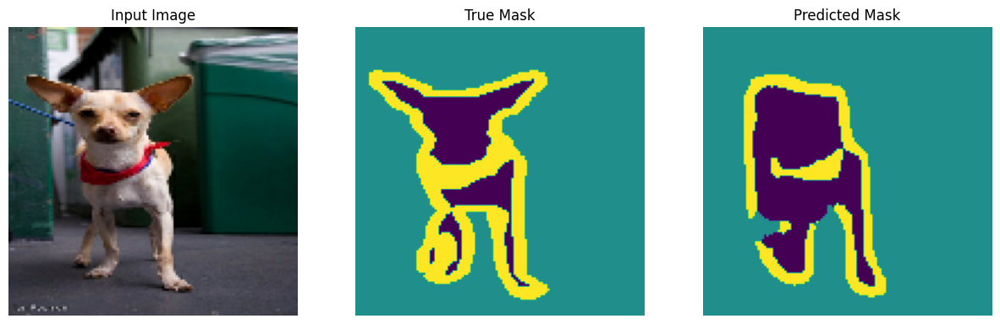

2/2 [==============================] - 0s 60ms/step


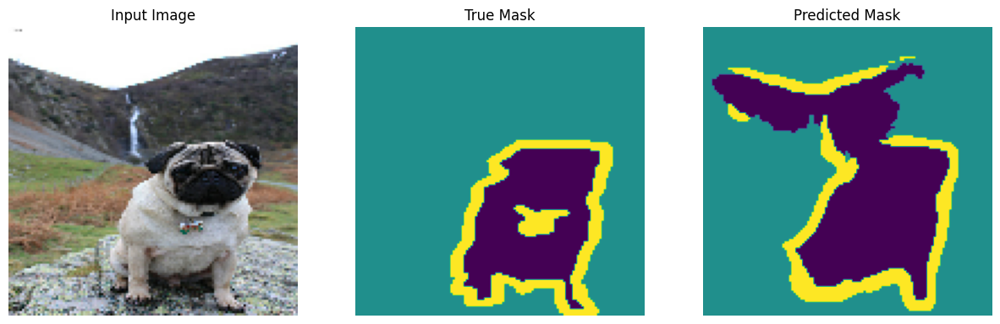

2/2 [==============================] - 0s 56ms/step


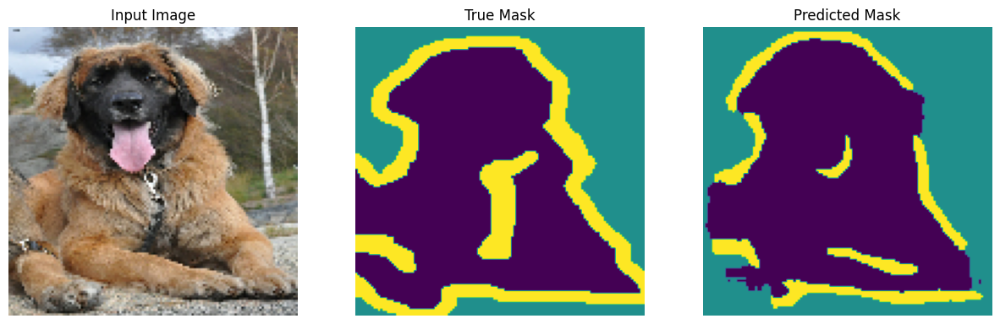

2/2 [==============================] - 0s 50ms/step


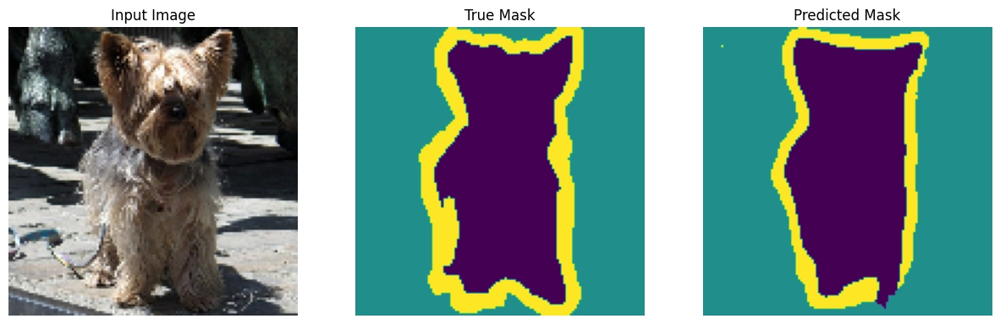

2/2 [==============================] - 0s 45ms/step


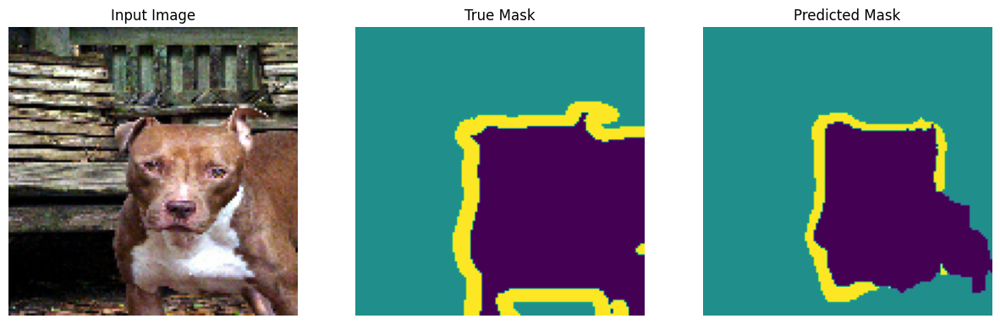

2/2 [==============================] - 0s 47ms/step


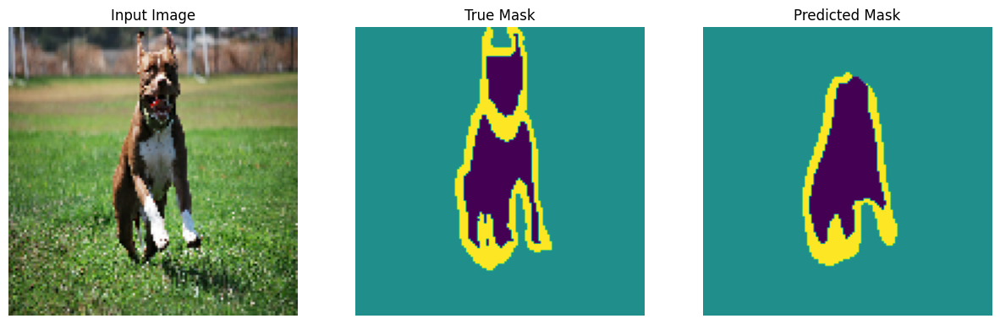

2/2 [==============================] - 0s 64ms/step


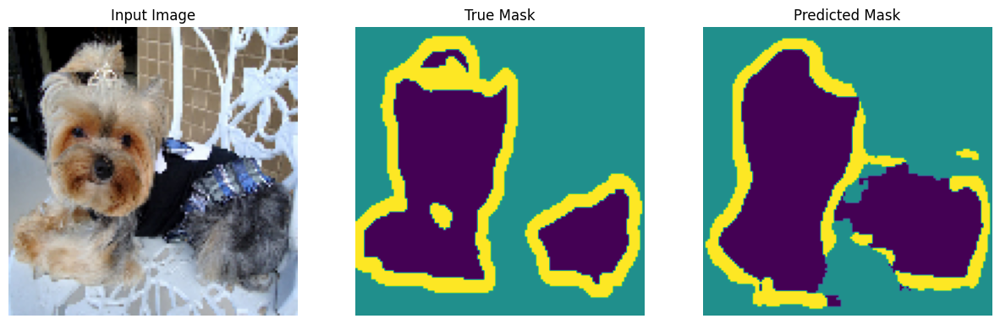

2/2 [==============================] - 0s 56ms/step


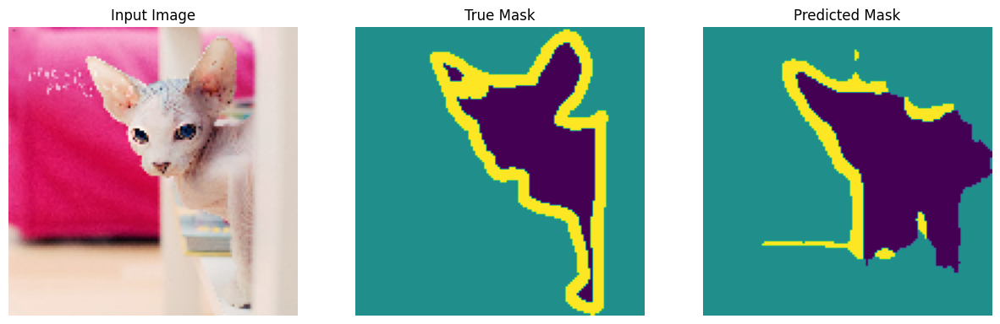

2/2 [==============================] - 0s 74ms/step


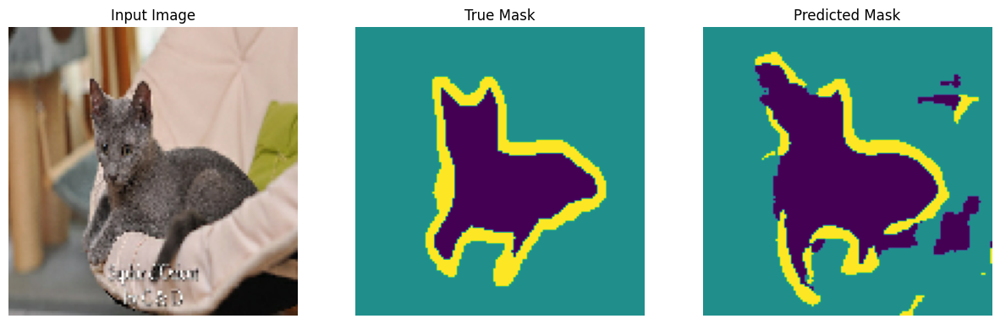

2/2 [==============================] - 0s 72ms/step


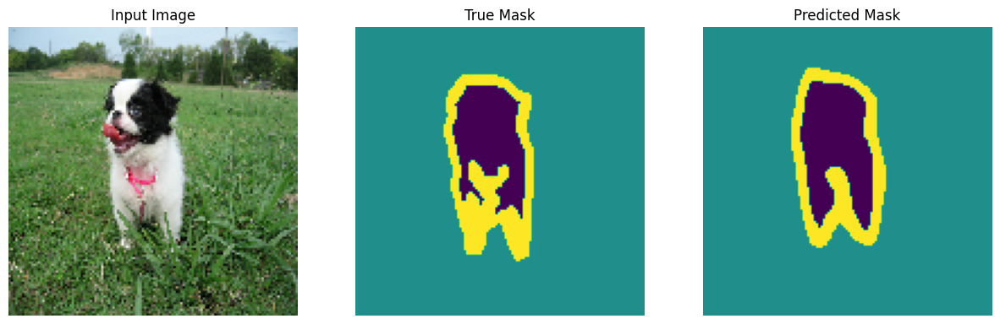

2/2 [==============================] - 0s 61ms/step


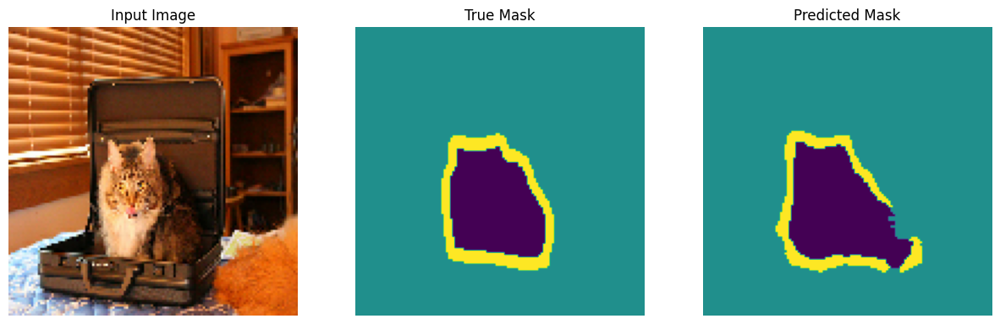

2/2 [==============================] - 0s 62ms/step


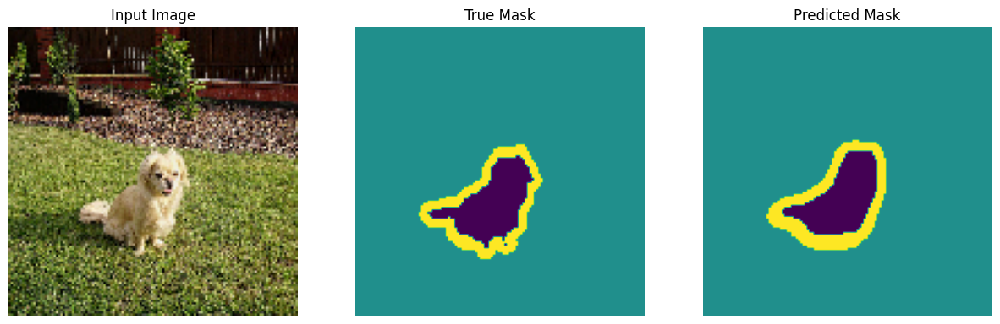

2/2 [==============================] - 0s 67ms/step


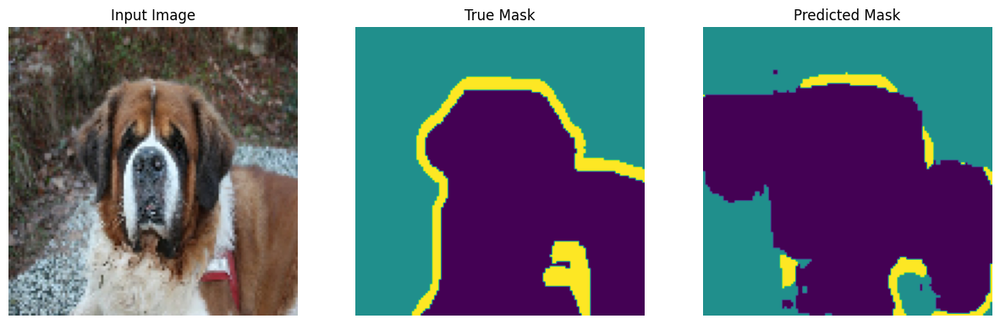

2/2 [==============================] - 0s 61ms/step


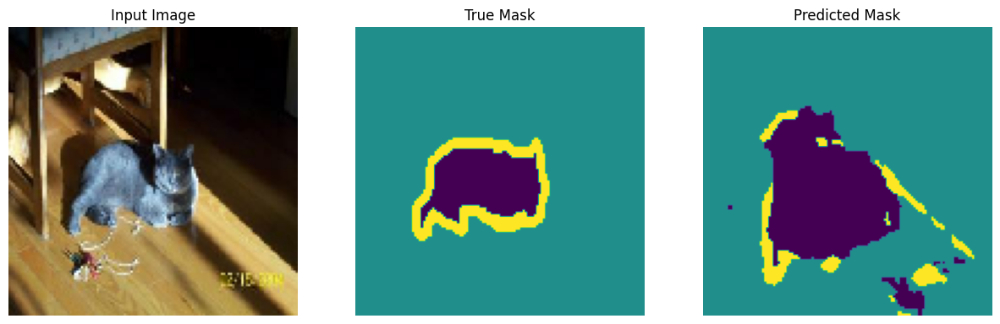

2/2 [==============================] - 0s 72ms/step


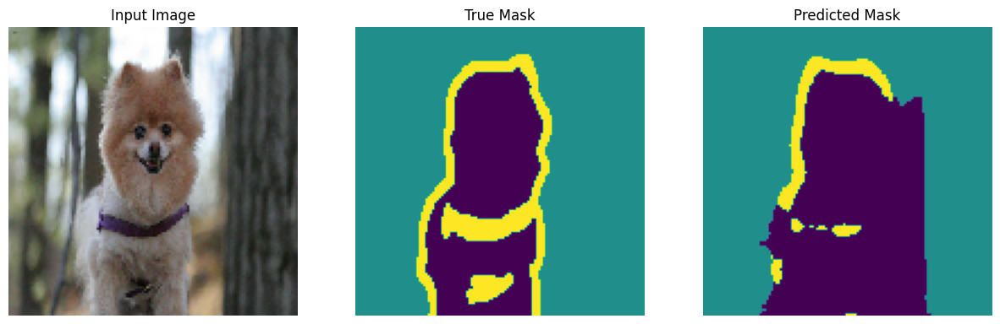

2/2 [==============================] - 0s 56ms/step


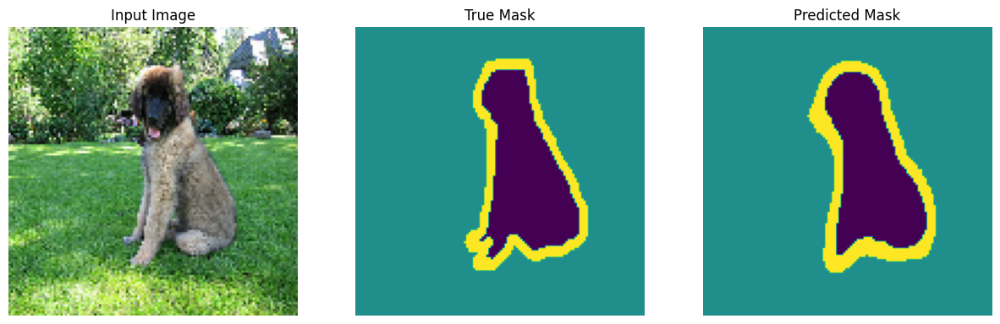

2/2 [==============================] - 0s 57ms/step


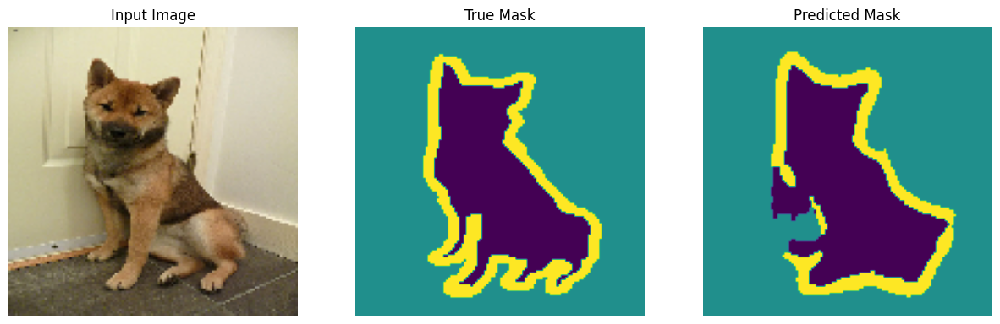

2/2 [==============================] - 0s 70ms/step


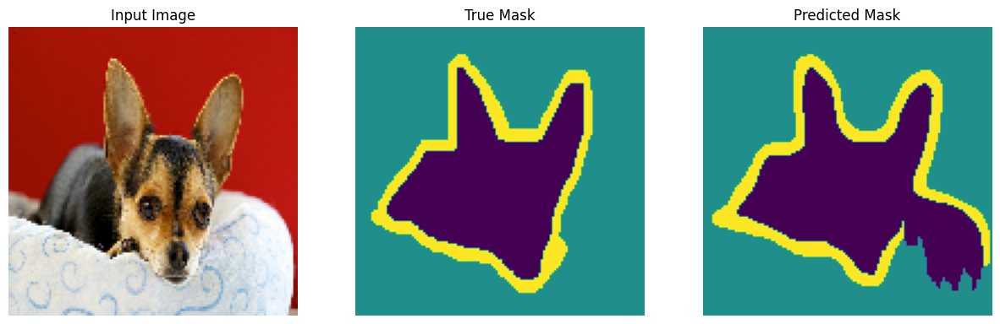

2/2 [==============================] - 0s 79ms/step


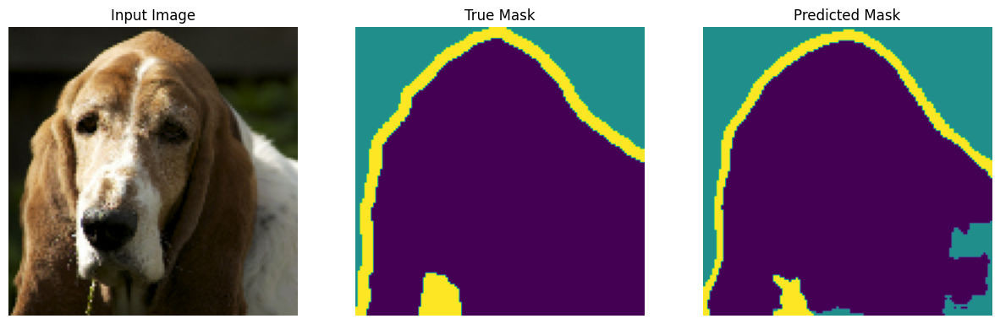

2/2 [==============================] - 0s 61ms/step


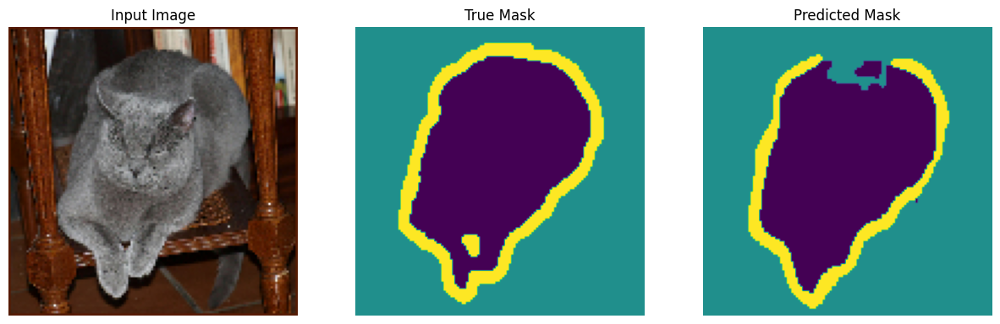

2/2 [==============================] - 0s 44ms/step


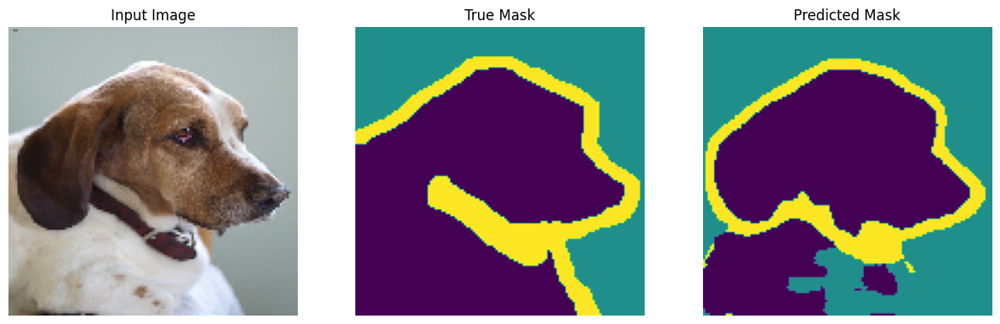

2/2 [==============================] - 0s 45ms/step


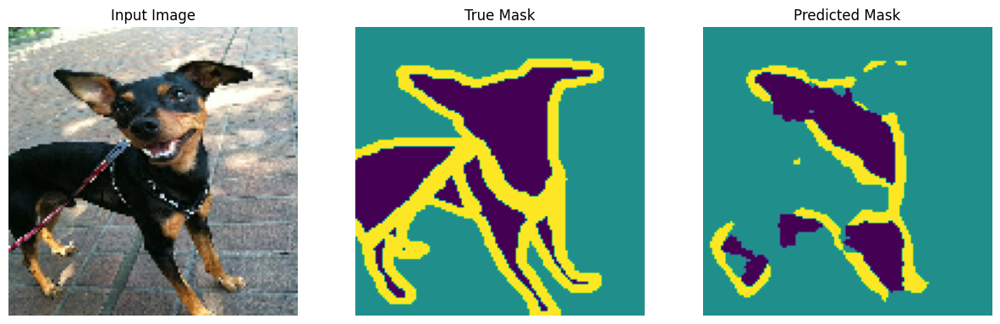

2/2 [==============================] - 0s 44ms/step


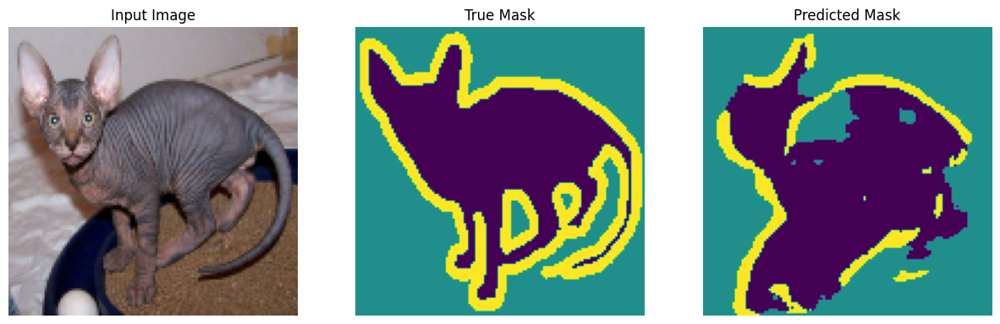

1/1 [==============================] - 2s 2s/step


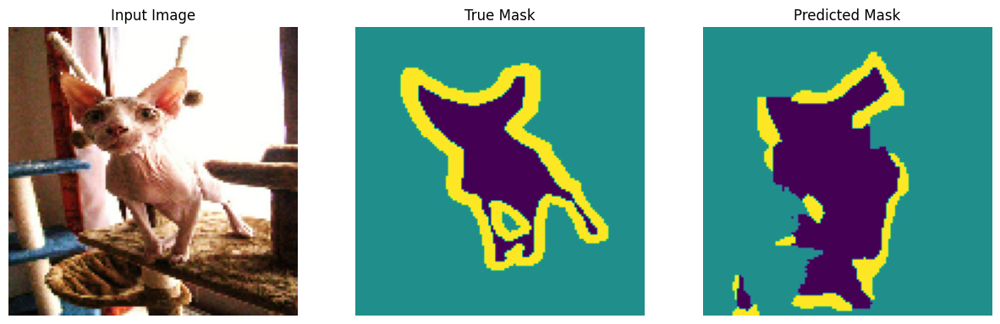

In [ ]:
def create_mask(pred_mask):
 pred_mask = tf.argmax(pred_mask, axis=-1)
 pred_mask = pred_mask[..., tf.newaxis]
 return pred_mask[0]

def show_predictions(dataset=None, num=1):
 if dataset:
   for image, mask in dataset.take(num):
     pred_mask = segnet_model.predict(image)
     display([image[0], mask[0], create_mask(pred_mask)])
 else:
   display([sample_image, sample_mask,
            create_mask(model.predict(sample_image[tf.newaxis, ...]))])

count = 0
for i in test_batches:
   count +=1
print("number of batches:", count)

show_predictions(test_batches, 150)

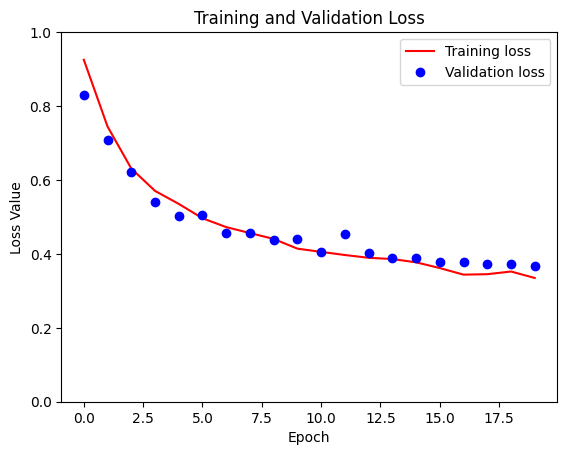

In [ ]:
loss = model_history.history['loss']
val_loss = model_history.history['val_loss']

plt.figure()
plt.plot(model_history.epoch, loss, 'r', label='Training loss')
plt.plot(model_history.epoch, val_loss, 'bo', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 1])
plt.legend()
plt.show()